In [3]:
import pandas as pd
import sqlite3
import matplotlib
import ipywidgets
import matplotlib.pyplot as plt
import regex as re
import bqplot
import numpy as np
import seaborn as sb

import plotly.graph_objects as go
import networkx as nx

In [4]:
principals = pd.read_csv('Imdb_data/title.principals.tsv',delimiter='\t')
basics = pd.read_csv('Imdb_data/title.basics.tsv',delimiter='\t')
imdb_names = pd.read_csv('Imdb_data/name.basics.tsv',delimiter='\t')

/Users/tzacks2/.conda/envs/DataViz2/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3457: DtypeWarning: Columns (4,5) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [5]:
wiki_cast_excel = pd.read_csv('wiki_cast_excel.csv')
wiki_cast_excel.iloc[29]
wiki_cast = wiki_cast_excel.fillna('No')
wiki_cast

,Performer,Time on SNL,No. of seasons,Repertory Player,Featured Player,Middle Group,"""Weekend Update"" Anchor",Hosted,Writer
0,Fred Armisen,2002–2013,11,Yes,Yes,No,No,Yes,No
1,Aristotle Athari,2021–present,1,No,Yes,No,No,No,No
2,Dan Aykroyd,1975–1979,4,Yes,No,No,Yes,Yes,Yes
3,Peter Aykroyd,1980,1,No,Yes,No,No,No,Yes
4,Morwenna Banks,1995,1,Yes,No,No,No,No,No
...,...,...,...,...,...,...,...,...,...
154,Casey Wilson,2008–2009,2,No,Yes,No,No,No,No
155,Fred Wolf,1996–1996,2,No,Yes,No,No,No,Yes
156,Bowen Yang,2019–present,3,Yes,Yes,No,No,No,Yes
157,Sasheer Zamata,2014–2017,4,Yes,Yes,No,No,No,No


Text(0, 0.5, 'No. of Seasons')

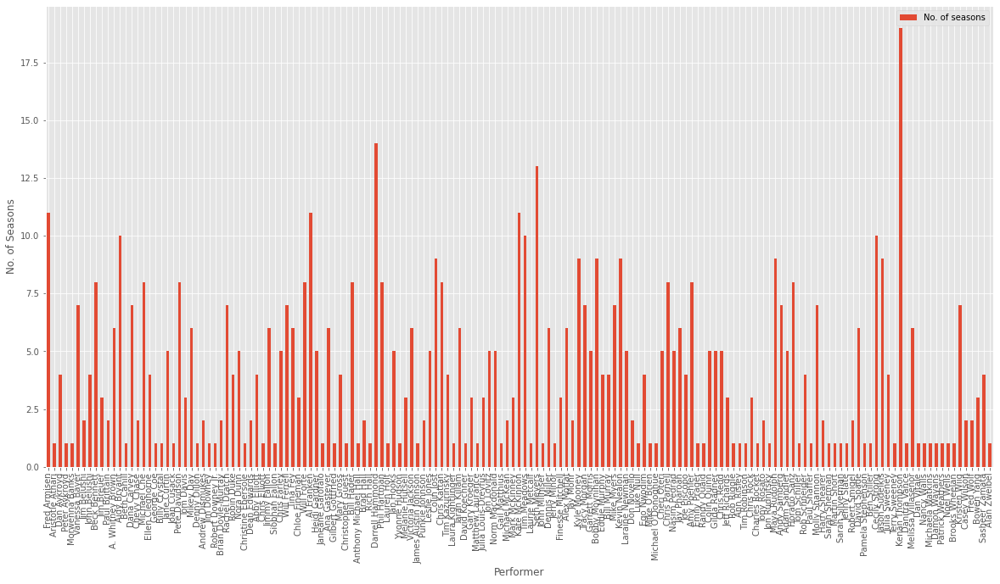

In [6]:
plt.style.use('ggplot')
ax = wiki_cast.plot(x= "Performer",y="No. of seasons", figsize = (20,10), kind = 'bar')
ax.set_ylabel('No. of Seasons')

In [7]:
imdb_names_df = imdb_names
imdb_names_df

,nconst,primaryName,birthYear,deathYear,primaryProfession,knownForTitles
0,nm0000001,Fred Astaire,1899,1987,"soundtrack,actor,miscellaneous","tt0050419,tt0053137,tt0031983,tt0072308"
1,nm0000002,Lauren Bacall,1924,2014,"actress,soundtrack","tt0071877,tt0037382,tt0117057,tt0038355"
2,nm0000003,Brigitte Bardot,1934,\N,"actress,soundtrack,music_department","tt0054452,tt0056404,tt0057345,tt0049189"
3,nm0000004,John Belushi,1949,1982,"actor,soundtrack,writer","tt0078723,tt0072562,tt0077975,tt0080455"
4,nm0000005,Ingmar Bergman,1918,2007,"writer,director,actor","tt0069467,tt0083922,tt0060827,tt0050986"
...,...,...,...,...,...,...
11554305,nm9993714,Romeo del Rosario,\N,\N,"animation_department,art_department","tt14069590,tt11657662,tt2455546"
11554306,nm9993716,Essias Loberg,\N,\N,NaN,\N
11554307,nm9993717,Harikrishnan Rajan,\N,\N,cinematographer,tt8736744
11554308,nm9993718,Aayush Nair,\N,\N,cinematographer,\N


In [8]:
imdb_name_list = imdb_names_df.values.tolist()
imdb_names_df.columns.tolist()

['nconst',
 'primaryName',
 'birthYear',
 'deathYear',
 'primaryProfession',
 'knownForTitles']

In [9]:
cross_imdb_wiki_list = []
for person in imdb_name_list:
    if person[1] in wiki_cast['Performer'].values:
        cross_imdb_wiki_list.append(person)

In [10]:
cross_name_list = (set([r[1] for r in cross_imdb_wiki_list]))
len(cross_name_list) # <- Missing 2 cast members

157

In [11]:
from collections import Counter

Counter([r[1] for r in cross_imdb_wiki_list]).most_common(10)

[('Tom Davis', 56),
 ("Mike O'Brien", 56),
 ('Bill Murray', 35),
 ('Tim Robinson', 32),
 ('Leslie Jones', 26),
 ('Chris Elliott', 24),
 ('Mike Myers', 23),
 ('Jeff Richards', 23),
 ('Dennis Miller', 21),
 ('Victoria Jackson', 18)]

In [12]:
cross_imdb_wiki_list

[['nm0000004',
  'John Belushi',
  '1949',
  '1982',
  'actor,soundtrack,writer',
  'tt0078723,tt0072562,tt0077975,tt0080455'],
 ['nm0000101',
  'Dan Aykroyd',
  '1952',
  '\\N',
  'writer,actor,producer',
  'tt0097428,tt0118747,tt0087332,tt0080455'],
 ['nm0000195',
  'Bill Murray',
  '1950',
  '\\N',
  'actor,soundtrack,writer',
  'tt1748122,tt0128445,tt0362270,tt0335266'],
 ['nm0000196',
  'Mike Myers',
  '1963',
  '\\N',
  'actor,writer,soundtrack',
  'tt0295178,tt0145660,tt0118655,tt0811138'],
 ['nm0000331',
  'Chevy Chase',
  '1943',
  '\\N',
  'actor,writer,soundtrack',
  'tt0085995,tt0097958,tt0080487,tt0092086'],
 ['nm0000345',
  'Billy Crystal',
  '1948',
  '\\N',
  'actor,writer,producer',
  'tt0101587,tt0098635,tt0113097,tt0122933'],
 ['nm0000349',
  'Joan Cusack',
  '1962',
  '\\N',
  'actress,soundtrack,writer',
  'tt0119229,tt1659337,tt0119360,tt0096463'],
 ['nm0000375',
  'Robert Downey Jr.',
  '1965',
  '\\N',
  'actor,producer,soundtrack',
  'tt1300854,tt0371746,tt4154

In [13]:
def check_names(name):
    cross_name_list = (set([r[1] for r in cross_imdb_wiki_list]))
    result = False
    
    if name in cross_name_list:
        result = True
    return result
SNL_name_check = [r for r in cross_imdb_wiki_list if check_names(r[1])]
(SNL_name_check)

[['nm0000004',
  'John Belushi',
  '1949',
  '1982',
  'actor,soundtrack,writer',
  'tt0078723,tt0072562,tt0077975,tt0080455'],
 ['nm0000101',
  'Dan Aykroyd',
  '1952',
  '\\N',
  'writer,actor,producer',
  'tt0097428,tt0118747,tt0087332,tt0080455'],
 ['nm0000195',
  'Bill Murray',
  '1950',
  '\\N',
  'actor,soundtrack,writer',
  'tt1748122,tt0128445,tt0362270,tt0335266'],
 ['nm0000196',
  'Mike Myers',
  '1963',
  '\\N',
  'actor,writer,soundtrack',
  'tt0295178,tt0145660,tt0118655,tt0811138'],
 ['nm0000331',
  'Chevy Chase',
  '1943',
  '\\N',
  'actor,writer,soundtrack',
  'tt0085995,tt0097958,tt0080487,tt0092086'],
 ['nm0000345',
  'Billy Crystal',
  '1948',
  '\\N',
  'actor,writer,producer',
  'tt0101587,tt0098635,tt0113097,tt0122933'],
 ['nm0000349',
  'Joan Cusack',
  '1962',
  '\\N',
  'actress,soundtrack,writer',
  'tt0119229,tt1659337,tt0119360,tt0096463'],
 ['nm0000375',
  'Robert Downey Jr.',
  '1965',
  '\\N',
  'actor,producer,soundtrack',
  'tt1300854,tt0371746,tt4154

In [14]:
def check_creds(works):
    SNL_IDs = ['tt0715791', 'tt0715791', 'tt0971348', 'tt10809086', 'tt0072562', 'tt1372614', 'tt2173702']
    result = False
    for work in works.split(','):
        if work in SNL_IDs:
            result = True
    return result
SNL_cred_check = [r for r in cross_imdb_wiki_list if check_creds(r[5])]
(SNL_cred_check)

[['nm0000004',
  'John Belushi',
  '1949',
  '1982',
  'actor,soundtrack,writer',
  'tt0078723,tt0072562,tt0077975,tt0080455'],
 ['nm0000902',
  'Jim Belushi',
  '1954',
  '\\N',
  'actor,music_department,producer',
  'tt0097637,tt0072562,tt0117468,tt0095963'],
 ['nm0001022',
  'Dana Carvey',
  '1955',
  '\\N',
  'actor,soundtrack,writer',
  'tt0072562,tt0108525,tt0105793,tt0295427'],
 ['nm0005265',
  'Kevin Nealon',
  '1953',
  '\\N',
  'actor,writer,soundtrack',
  'tt0072562,tt0116483,tt0439100,tt0120888'],
 ['nm0035488',
  'Fred Armisen',
  '1966',
  '\\N',
  'music_department,actor,writer',
  'tt0357413,tt1282140,tt0072562,tt1780441'],
 ['nm0112944',
  'A. Whitney Brown',
  '1952',
  '\\N',
  'writer,actor',
  'tt0096708,tt0072562,tt0166039,tt1094991'],
 ['nm0128639',
  'Beth Cahill',
  '\\N',
  '\\N',
  'actress,costume_designer,miscellaneous',
  'tt0155764,tt0262411,tt0164930,tt0072562'],
 ['nm0205569',
  'Tom Davis',
  '1952',
  '2012',
  'writer,actor,producer',
  'tt0086465,tt

In [15]:
SNL_df = pd.DataFrame(SNL_cred_check, columns = imdb_names.columns.tolist()).set_index('primaryName')
SNL_df

,nconst,birthYear,deathYear,primaryProfession,knownForTitles
primaryName,,,,,
John Belushi,nm0000004,1949,1982,"actor,soundtrack,writer","tt0078723,tt0072562,tt0077975,tt0080455"
Jim Belushi,nm0000902,1954,\N,"actor,music_department,producer","tt0097637,tt0072562,tt0117468,tt0095963"
Dana Carvey,nm0001022,1955,\N,"actor,soundtrack,writer","tt0072562,tt0108525,tt0105793,tt0295427"
Kevin Nealon,nm0005265,1953,\N,"actor,writer,soundtrack","tt0072562,tt0116483,tt0439100,tt0120888"
Fred Armisen,nm0035488,1966,\N,"music_department,actor,writer","tt0357413,tt1282140,tt0072562,tt1780441"
...,...,...,...,...,...
Aidy Bryant,nm5262775,1987,\N,"actress,writer,soundtrack","tt5462602,tt11092142,tt8962130,tt0072562"
Chris Redd,nm5412083,\N,\N,"actor,writer,soundtrack","tt3960412,tt5884792,tt7286456,tt0072562"
Fred Wolf,nm7440291,\N,\N,actor,"tt3910602,tt10222674,tt0072562"


In [16]:
wiki_cast = wiki_cast.set_index('Performer')
imdb_wiki_table = pd.concat([SNL_df, wiki_cast], axis=1, join="outer")
imdb_wiki_table

,nconst,birthYear,deathYear,primaryProfession,knownForTitles,Time on SNL,No. of seasons,Repertory Player,Featured Player,Middle Group,"""Weekend Update"" Anchor",Hosted,Writer
John Belushi,nm0000004,1949,1982,"actor,soundtrack,writer","tt0078723,tt0072562,tt0077975,tt0080455",1975–1979,4,Yes,No,No,No,No,Yes
Jim Belushi,nm0000902,1954,\N,"actor,music_department,producer","tt0097637,tt0072562,tt0117468,tt0095963",1983–1985,2,Yes,No,No,No,No,Yes
Dana Carvey,nm0001022,1955,\N,"actor,soundtrack,writer","tt0072562,tt0108525,tt0105793,tt0295427",1986–1993,7,Yes,No,No,No,Yes,Yes
Kevin Nealon,nm0005265,1953,\N,"actor,writer,soundtrack","tt0072562,tt0116483,tt0439100,tt0120888",1986–1995,9,Yes,Yes,No,Yes,No,Yes
Fred Armisen,nm0035488,1966,\N,"music_department,actor,writer","tt0357413,tt1282140,tt0072562,tt1780441",2002–2013,11,Yes,Yes,No,No,Yes,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...
Patrick Weathers,NaN,NaN,NaN,NaN,NaN,1980–1981,1,No,Yes,No,No,No,No
Kristen Wiig,NaN,NaN,NaN,NaN,NaN,2005–2012,7,Yes,Yes,No,No,Yes,No
Casey Wilson,NaN,NaN,NaN,NaN,NaN,2008–2009,2,No,Yes,No,No,No,No
Bowen Yang,NaN,NaN,NaN,NaN,NaN,2019–present,3,Yes,Yes,No,No,No,Yes


In [17]:
names_title_dict = {item[1]:item[5].split(',') for item in SNL_name_check}
names_title_dict

{'John Belushi': ['tt0078723', 'tt0072562', 'tt0077975', 'tt0080455'],
 'Dan Aykroyd': ['tt0097428', 'tt0118747', 'tt0087332', 'tt0080455'],
 'Bill Murray': ['tt5156614'],
 'Mike Myers': ['\\N'],
 'Chevy Chase': ['tt0085995', 'tt0097958', 'tt0080487', 'tt0092086'],
 'Billy Crystal': ['tt0101587', 'tt0098635', 'tt0113097', 'tt0122933'],
 'Joan Cusack': ['tt0119229', 'tt1659337', 'tt0119360', 'tt0096463'],
 'Robert Downey Jr.': ['tt1300854', 'tt0371746', 'tt4154796', 'tt0988045'],
 'Chris Farley': ['\\N'],
 'Janeane Garofalo': ['tt0382932', 'tt0132347', 'tt0117979', 'tt0243655'],
 'Julia Louis-Dreyfus': ['tt0462128', 'tt1759761', 'tt2390361', 'tt0098904'],
 'Eddie Murphy': ['tt0492509'],
 'Jim Belushi': ['tt0097637', 'tt0072562', 'tt0117468', 'tt0095963'],
 'Dana Carvey': ['tt0072562', 'tt0108525', 'tt0105793', 'tt0295427'],
 'Adam Sandler': ['tt13689618', 'tt10428498', 'tt0068120', 'tt12116598'],
 'Christopher Guest': ['tt4334642', 'tt1024855'],
 'Anthony Michael Hall': ['tt0468569', 't

In [18]:
for i in SNL_name_check:
    for x in i:
        if str(x).startswith('tt'):
            titles = x.split(',')
    
    name = i[1]
    names_title_dict[name] += titles

for name, titles in names_title_dict.items():
    names_title_dict[name] = list(set(titles))
    
names_title_dict

{'John Belushi': ['tt0072562', 'tt0078723', 'tt0077975', 'tt0080455'],
 'Dan Aykroyd': ['tt0097428', 'tt0087332', 'tt0118747', 'tt0080455'],
 'Bill Murray': ['tt5156614',
  'tt3790306',
  'tt0961721',
  'tt1538443',
  'tt2784678',
  'tt3603706',
  'tt1600694',
  'tt2282941',
  'tt3503754',
  'tt2243836',
  'tt0189500',
  'tt1490534',
  'tt1884251',
  'tt0072562',
  'tt2357748',
  'tt5774598',
  'tt3091734',
  'tt4571940',
  'tt2202391',
  'tt0362270',
  'tt3147486',
  'tt13998382',
  'tt0128445',
  'tt4742812',
  'tt12762460',
  'tt1687207',
  'tt2356940',
  'tt2828570',
  'tt2147467',
  'tt14779558',
  'tt0448004',
  'tt1740656',
  'tt1748122',
  'tt0122145',
  'tt0097132',
  'tt1732762',
  'tt1911645',
  'tt2450652',
  'tt1972582',
  'tt0335266',
  'tt0281438',
  'tt0457251',
  'tt16589596',
  'tt1210095',
  'tt0351810',
  'tt0499556',
  'tt0115367',
  'tt1810727',
  'tt3872944',
  'tt1837678',
  'tt6384192',
  'tt0288154',
  'tt3231836'],
 'Mike Myers': ['tt6137590',
  'tt14855722',

In [19]:
import csv
headers = ['name', 'title']
rows = []
for name, titles in names_title_dict.items():
    for t in titles:
        rows.append([name, t])


with open('snl_name_title_nodes.csv', 'w', encoding = 'utf-8') as outfile:
    csvout = csv.writer(outfile)
    csvout.writerow(headers)
    csvout.writerows(rows)

# Visualizations

In [20]:
import pygraphviz as pgv

G = pgv.AGraph(names_title_dict,
               strict=True,
               directed=True,
               rankdir="RL",
               ranksep="0.25",
               ordering="in")

G.layout('dot')

G.draw('name_to_titles.png')

G.draw('name_to_titles.svg')

/Users/tzacks2/.conda/envs/DataViz2/lib/python3.7/site-packages/pygraphviz/agraph.py:1390: RuntimeWarning: neato: graph is too large for cairo-renderer bitmaps. Scaling by 0.403878 to fit

  warnings.warn(b"".join(errors).decode(self.encoding), RuntimeWarning)


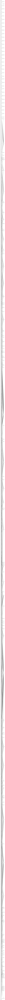

In [21]:
from IPython import display
display.Image('name_to_titles.png')

In [22]:
same_title_dict = {}
unique_title_list = []
for x in names_title_dict:
#     print((x))
    for unique_title in names_title_dict[x]:
        if unique_title not in unique_title_list:
            unique_title_list.append(unique_title)
    per_title_name_list = []
    for i in unique_title_list:
        
        if names_title_dict[x] == i:
            
            per_title_name_list.append(name_titles_dict[x])
        same_title_dict[i] = per_title_name_list
name = names_title_dict.keys()
title = same_title_dict.keys()
for title in same_title_dict:
#     print(title)
    name_list = []
#     print(name)
    for name in names_title_dict:
        if str(title) in names_title_dict[name] and name not in name_list:
#             print(name,title)
            name_list.append(name)
    same_title_dict[title] = name_list
            #     same_title_dict[title] = list((name))
same_title_dict

{'tt0072562': ['John Belushi',
  'Bill Murray',
  'Jim Belushi',
  'Dana Carvey',
  'Kevin Nealon',
  'Fred Armisen',
  'A. Whitney Brown',
  'Beth Cahill',
  'Pete Davidson',
  'Tom Davis',
  'Robin Duke',
  'Chris Elliott',
  'Al Franken',
  'Mary Gross',
  'Rich Hall',
  'Darrell Hammond',
  'Phil Hartman',
  'Yvonne Hudson',
  'Melanie Hutsell',
  'Leslie Jones',
  'Tim Kazurinsky',
  'Taran Killam',
  'Gary Kroeger',
  'Gail Matthius',
  'Kate McKinnon',
  'Tracy Morgan',
  'Garrett Morris',
  'Don Novello',
  "Michael O'Donoghue",
  'Joe Piscopo',
  'Amy Poehler',
  'Gilda Radner',
  'Jeff Richards',
  'Ann Risley',
  'Tim Robinson',
  'Tom Schiller',
  'Robert Smigel',
  'Kenan Thompson',
  'Dan Vitale',
  'Fred Wolf',
  'Alan Zweibel',
  'Seth Meyers',
  'Lauren Holt',
  'Bobby Moynihan',
  'Finesse Mitchell',
  'Mikey Day',
  'Andy Samberg',
  'Paul Brittain',
  'Colin Jost',
  'Abby Elliott',
  'John Milhiser',
  'Vanessa Bayer',
  'Noël Wells',
  'Luke Null',
  'Melissa Vill

In [23]:
G = pgv.AGraph(same_title_dict,
               strict=True,
               directed=False,
               rankdir="RL",
               ranksep="0.25",
               ordering="in")

G.layout('dot')

G.draw('title_to_names.png')

G.draw('title_to_names.svg')

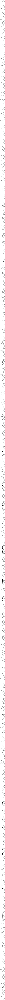

In [24]:
display.Image('title_to_names.png')

In [25]:
values = list(set([x for y in names_title_dict.values() for x in y]))
data = {}
for key in names_title_dict.keys():
    data[key] = [True if value in names_title_dict[key] else False for value in values]

boolean_table_name_cols = pd.DataFrame(data, index=values)
# (pd.DataFrame(boolean_table_name_cols))
boolean_table_name_cols

,John Belushi,Dan Aykroyd,Bill Murray,Mike Myers,Chevy Chase,Billy Crystal,Joan Cusack,Robert Downey Jr.,Chris Farley,Janeane Garofalo,...,Ego Nwodim,Brooks Wheelan,Cecily Strong,Aidy Bryant,Chris Redd,Jim Downey,Bowen Yang,Andrew Dismukes,Siobhan Fallon,Punkie Johnson
tt0094540,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
tt1571249,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
tt1111291,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
tt5346900,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
tt1575557,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
tt3872944,False,False,True,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
tt0119229,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
tt0078723,True,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
tt9881938,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [26]:
# https://stackoverflow.com/questions/41964618/boolean-matrix-form-pythons-dict-of-lists
values = list(set([x for y in same_title_dict.values() for x in y]))
data = {}
for key in same_title_dict.keys():
    data[key] = [ True if value in same_title_dict[key] else False for value in values]

boolean_table_title_cols = pd.DataFrame(data, index=values)
pd.DataFrame(boolean_table_title_cols)

,tt0072562,tt0078723,tt0077975,tt0080455,tt0097428,tt0087332,tt0118747,tt5156614,tt3790306,tt0961721,...,tt2452244,tt6078096,tt6279022,tt14508698,tt13858722,tt6463510,tt7778796,tt5821764,tt5117666,tt7242698
A. Whitney Brown,True,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Mike Myers,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Bowen Yang,False,False,False,False,False,False,False,False,False,False,...,True,True,False,False,False,False,False,False,False,False
Fred Armisen,True,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Taran Killam,True,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Seth Meyers,True,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Punkie Johnson,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,True,True,True,True
Anthony Michael Hall,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Dean Edwards,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


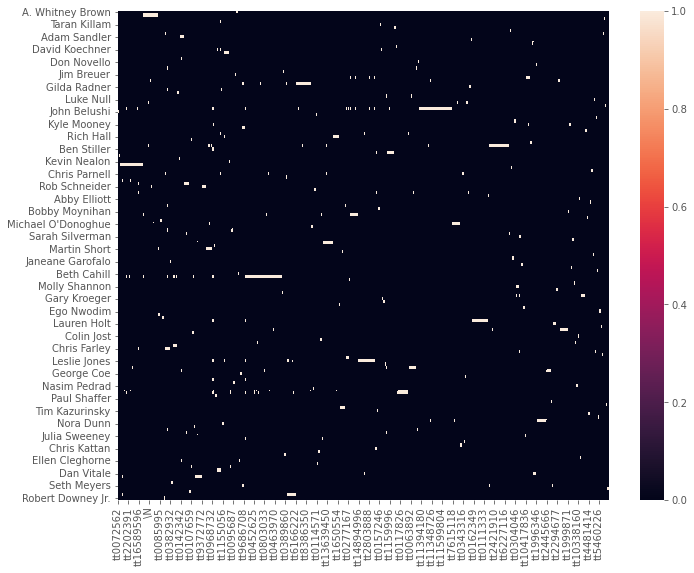

In [27]:
fig, ax = plt.subplots(figsize=(11, 9))
sb.heatmap(boolean_table_title_cols)
plt.show()

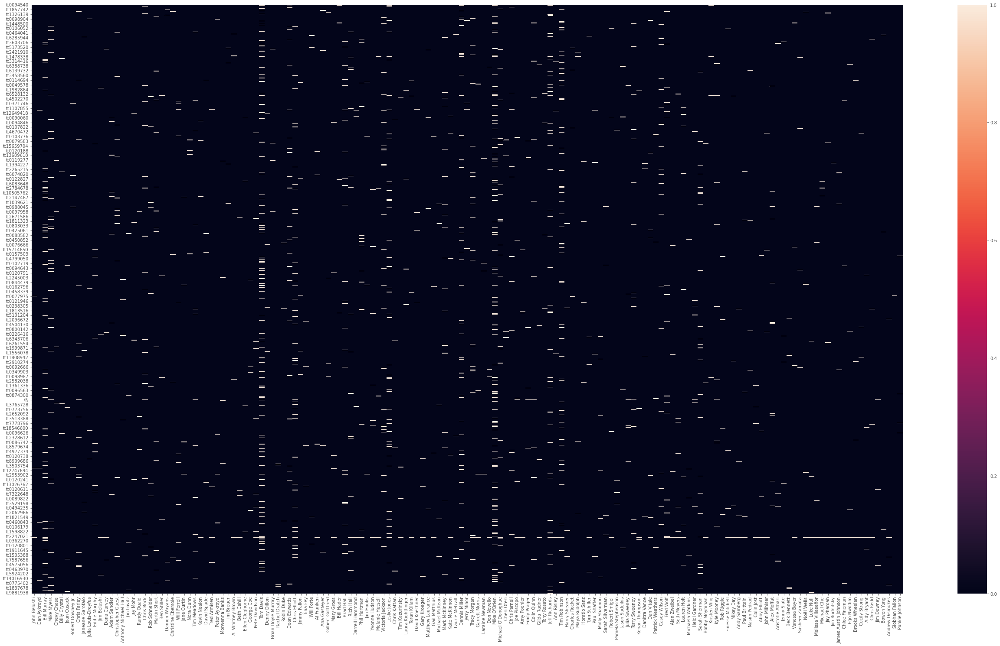

In [30]:
fig, ax = plt.subplots(figsize=(45, 25))
full_heatmap = sb.heatmap(boolean_table_name_cols)
plt.savefig('full_heatmap.png')

In [60]:
# ATTEMPT AT A NETWORK NODE GRAPH
# g = nx.DiGraph(same_title_dict)
# g.add_nodes_from(same_title_dict.keys())
# for k, v in same_title_dict.items():
#     g.add_edges_from(([(k, t) for t in v]))
#     node_trace = go.Scatter(
#     x=node_x, y=node_y,
#     mode='markers',
#     hoverinfo='text',
#     marker=dict(
#         showscale=True,
#         # colorscale options
#         #'Greys' | 'YlGnBu' | 'Greens' | 'YlOrRd' | 'Bluered' | 'RdBu' |
#         #'Reds' | 'Blues' | 'Picnic' | 'Rainbow' | 'Portland' | 'Jet' |
#         #'Hot' | 'Blackbody' | 'Earth' | 'Electric' | 'Viridis' |
#         colorscale='YlGnBu',
#         reversescale=True,
#         color=[],
#         size=10,
#         colorbar=dict(
#             thickness=15,
#             title='Node Connections',
#             xanchor='left',
#             titleside='right'),
#         line_width=2))
# nx.draw(g,with_labels=True)

# node_adjacencies = []
# node_text = []
# for node, adjacencies in enumerate(g.adjacency()):
#     node_adjacencies.append(len(adjacencies[1]))
#     node_text.append('# of connections: '+str(len(adjacencies[1])))

# node_trace.marker.color = node_adjacencies
# node_trace.text = node_text
# # Create Network Graph
# fig = go.Figure(data=[edge_trace, node_trace],
#              layout=go.Layout(
#                 title='<br>Network graph made with Python',
#                 titlefont_size=24,
#                 showlegend=False,
#                 hovermode='closest',
#                 margin=dict(b=20,l=5,r=5,t=40),
#                 annotations=[ dict(
#                     text="Python code: <a href='https://plotly.com/ipython-notebooks/network-graphs/'> https://plotly.com/ipython-notebooks/network-graphs/</a>",
#                     showarrow=False,
#                     xref="paper", yref="paper",
#                     x=0.005, y=-0.002 ) ],
#                 xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
#                 yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))                )
# fig.show()

In [ ]:
for actor in names_title_dict:
    fig, ax = plt.subplots(figsize=(11, 9))
    # https://stackoverflow.com/questions/41964618/boolean-matrix-form-pythons-dict-of-lists
    values = names_title_dict[actor]
    print(actor,values)
    data = {}
    boolean_table_name_cols = pd.DataFrame(data, columns=values)

    for key in names_title_dict:
        print(key)
        data[actor] = [True if value in names_title_dict[key] else False for value in values]
        print(data[actor])
#         for index in boolean_table_name_cols:
#             boolean_table_name_cols.append(data[actor])
        boolean_table_name_cols
        
#         sb.heatmap(boolean_table_name_cols)
#     plt.GridSpec(boolean_table_title_cols,ncols=len(values))
#     plt.show()

John Belushi ['tt0078723', 'tt0080455', 'tt0072562', 'tt0077975']
John Belushi
[True, True, True, True]
Dan Aykroyd
[False, True, False, False]
Bill Murray
[False, False, True, False]
Mike Myers
[False, False, False, False]
Chevy Chase
[False, False, False, False]
Billy Crystal
[False, False, False, False]
Joan Cusack
[False, False, False, False]
Robert Downey Jr.
[False, False, False, False]
Chris Farley
[False, False, False, False]
Janeane Garofalo
[False, False, False, False]
Julia Louis-Dreyfus
[False, False, False, False]
Eddie Murphy
[False, False, False, False]
Jim Belushi
[False, False, True, False]
Dana Carvey
[False, False, True, False]
Adam Sandler
[False, False, False, False]
Christopher Guest
[False, False, False, False]
Anthony Michael Hall
[False, False, False, False]
Jon Lovitz
[False, False, False, False]
Jay Mohr
[False, False, False, False]
Randy Quaid
[False, False, False, False]
Chris Rock
[False, False, False, False]
Rob Schneider
[False, False, False, False]
Mart

Joan Cusack ['tt0119229', 'tt0119360', 'tt1659337', 'tt0096463']
John Belushi
[False, False, False, False]
Dan Aykroyd
[False, False, False, False]
Bill Murray
[False, False, False, False]
Mike Myers
[False, False, False, False]
Chevy Chase
[False, False, False, False]
Billy Crystal
[False, False, False, False]
Joan Cusack
[True, True, True, True]
Robert Downey Jr.
[False, False, False, False]
Chris Farley
[False, False, False, False]
Janeane Garofalo
[False, False, False, False]
Julia Louis-Dreyfus
[False, False, False, False]
Eddie Murphy
[False, False, False, False]
Jim Belushi
[False, False, False, False]
Dana Carvey
[False, False, False, False]
Adam Sandler
[False, False, False, False]
Christopher Guest
[False, False, False, False]
Anthony Michael Hall
[False, False, False, False]
Jon Lovitz
[False, False, False, False]
Jay Mohr
[False, False, False, False]
Randy Quaid
[False, False, False, False]
Chris Rock
[False, False, False, False]
Rob Schneider
[False, False, False, False]
M

[False, False, False, False, False, False, False, False, False, False, False]
Chris Elliott
[False, False, False, False, False, False, False, False, False, False, False]
Jimmy Fallon
[False, False, False, False, False, False, False, False, False, False, False]
Tina Fey
[False, False, False, False, False, False, False, False, False, False, False]
Will Forte
[False, False, False, False, False, False, False, False, False, False, False]
Al Franken
[False, False, False, False, False, False, False, False, False, False, False]
Ana Gasteyer
[False, False, False, False, False, False, False, False, False, False, False]
Gilbert Gottfried
[False, False, False, False, False, False, False, False, False, False, False]
Mary Gross
[False, False, False, False, False, False, False, False, False, False, False]
Bill Hader
[False, False, False, False, False, False, False, False, False, False, False]
Brad Hall
[False, False, True, False, False, False, False, False, False, False, False]
Rich Hall
[False, Fals

Maya Rudolph
[False, False, False, False]
Horatio Sanz
[False, False, False, False]
Tom Schiller
[False, False, False, False]
Paul Shaffer
[False, False, False, False]
Molly Shannon
[False, False, False, False]
Sarah Silverman
[False, False, False, False]
Robert Smigel
[False, False, False, False]
Pamela Stephenson
[False, False, False, False]
Jason Sudeikis
[False, False, False, False]
Julia Sweeney
[False, False, False, False]
Terry Sweeney
[False, False, False, False]
Kenan Thompson
[False, False, False, False]
Danitra Vance
[False, False, False, False]
Dan Vitale
[False, False, False, False]
Patrick Weathers
[False, False, False, False]
Casey Wilson
[False, False, False, False]
Fred Wolf
[False, False, False, False]
Alan Zweibel
[False, False, False, False]
Seth Meyers
[False, False, False, False]
Lauren Holt
[False, False, False, False]
Michaela Watkins
[False, False, False, False]
Heidi Gardner
[False, False, False, False]
Sarah Sherman
[False, False, False, False]
Bobby Moynihan

/Users/tzacks2/.conda/envs/DataViz2/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


[False, False, False, False]
Aidy Bryant
[False, False, False, False]
Chris Redd
[False, False, False, False]
Jim Downey
[False, False, False, False]
Bowen Yang
[False, False, False, False]
Andrew Dismukes
[False, False, False, False]
Siobhan Fallon
[False, False, False, False]
Punkie Johnson
[False, False, False, False]
Damon Wayans ['tt0273855', 'tt0104897', 'tt0102266', 'tt0110443']
John Belushi
[False, False, False, False]
Dan Aykroyd
[False, False, False, False]
Bill Murray
[False, False, False, False]
Mike Myers
[False, False, False, False]
Chevy Chase
[False, False, False, False]
Billy Crystal
[False, False, False, False]
Joan Cusack
[False, False, False, False]
Robert Downey Jr.
[False, False, False, False]
Chris Farley
[False, False, False, False]
Janeane Garofalo
[False, False, False, False]
Julia Louis-Dreyfus
[False, False, False, False]
Eddie Murphy
[False, False, False, False]
Jim Belushi
[False, False, False, False]
Dana Carvey
[False, False, False, False]
Adam Sandler
[

In [29]:
data = {}
for actor in names_title_dict:
    # https://stackoverflow.com/questions/41964618/boolean-matrix-form-pythons-dict-of-lists
    values = names_title_dict[actor]
    headers = values[:]
    headers.insert(0,actor)
#     print(headers)
#     print(values)

#     print(actor,values)
    
    actor_dict_2d = [headers]

    for key in names_title_dict:
#         print(key)
#         data[actor] = [True if value in names_title_dict[key] else False for value in values]
#         print(data[actor])
        t_or_f = [1 if value in names_title_dict[key] else 0 for value in values]
        t_or_f.insert(0,key)
        actor_dict_2d.append(t_or_f)
    data[actor] = actor_dict_2d
# print(data)

In [30]:
# table = pd.DataFrame(data['Kate McKinnon']).set_index(0)

# header = table.iloc[0]
# table.columns = header
# table = pd.DataFrame(table[1:], columns=header)
# wiki_cast.index

In [31]:
def create_table(i):
    table = pd.DataFrame(data[wiki_cast.iloc[i].name]).set_index(0)
    header = table.iloc[0]
    table.columns = header
    table = pd.DataFrame(table[1:], columns=header)
    return table
table = create_table(1)

In [32]:
wiki_cast = wiki_cast[::-1]
def on_selection(change):
    if (change['owner'].selected) is not None and len(change['owner'].selected)==1: # only allow user to select one grid
            i = change['owner'].selected[0]

            myLabel.value = wiki_cast.iloc[i].name + ': ' + str(wiki_cast.iloc[i]['No. of seasons']) + ' seasons on SNL'
            table = create_table(i)
            heat_map.color = table.values.astype('float')
            heat_map.row = table.index.values.astype(str),
            heat_map.column = table.columns.values.astype(str)
#how to ignore if NoneType selected?

In [33]:
myLabel = ipywidgets.Label()

In [34]:
####### BAR PLOT ######
# 2. scales
x_scb = bqplot.OrdinalScale()
y_scb = bqplot.LinearScale()
# 3. axis 
x_axb = bqplot.Axis(label='SNL Cast Member', orientation = 'vertical',
                    scale=x_scb, label_offset = '115px',
                    tick_style={'font-size':'3px','text-anchor': 'end'},
                    padding = 0.25)
y_axb = bqplot.Axis(label='Number of Seasons on SNL',
                    scale=y_scb, label_offset = '40 px')

# 4. mark -- heatmap using out colors to map our data
no_SNL_seasons_bar = bqplot.Bars(orientation='horizontal',x=wiki_cast.index,
                                 y=wiki_cast['No. of seasons'],
                                 align='center',scales = {'x':x_scb,
                                                          'y':y_scb},
                                 interactions={"click": "select"},
                                 selected_style={"stroke": "green", 
                                                 "fill": "skyblue"})


margin = dict(top=0, bottom=50, left=140, right=0)


no_SNL_seasons_bar.observe(on_selection,'selected')

fig_bars = bqplot.Figure(marks=[no_SNL_seasons_bar],
                         axes=[x_axb, y_axb], fig_margin=margin)
fig_bars.axes[0].tick_style = {'text-anchor': 'end'}

fig_bars.layout.height = '1700px'
fig_bars.layout.width = '550px'
fig_bars

Figure(axes=[Axis(label='SNL Cast Member', label_offset='115px', orientation='vertical', scale=OrdinalScale(),…

In [35]:
table.values.astype(int)

array([[0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0,

In [36]:
##GRID HEAT MAP##

# 2. scales
col_sc = bqplot.OrdinalColorScale(scheme="Pastel1")
x_sc = bqplot.OrdinalScale()
y_sc = bqplot.OrdinalScale()

# 3. axis
col_ax = bqplot.ColorAxis(scale=col_sc, orientation='horizontal', side='top', label = 'Color Scale')
x_ax = bqplot.Axis(scale=x_sc, label='Title IDs',tick_rotate=-90, tick_style ={'font-size':'8px'},  label_offset ='50px')
y_ax = bqplot.Axis(scale=y_sc, orientation='vertical', label='Actors',tick_offset = '50px',tick_style ={'font-size':'8px'}, label_offset ='50px')

# 4. marks
heat_map = bqplot.GridHeatMap(color = table.values.astype('float'),
                             row = table.index.values.astype(str),
                             column = table.columns.values.astype(str),scales = {'color': col_sc})

fig = bqplot.Figure(marks=[heat_map], axes=[col_ax,x_ax, y_ax])
fig.layout.height = '1700px'
fig.layout.width = '550px'

In [37]:
Label_bar = ipywidgets.VBox([myLabel,fig_bars])
myDashboard = ipywidgets.HBox([Label_bar,fig])
myDashboard

My dashboard is used to see the frequency of collaboration amongst SNL cast members. The left part of the graph is a bar chart, representing the length of tenure at SNL. When a user clicks on a cast member's bar, the heat map on the right gets updated. At the moment, the order is inconsistent between the two portions of the graph. This iteration of the heat map is more of a representation of the overlap between IMDb 'Known For Titles,' which are the group of four or five top titles on an actor's (or director, producer, etc.) resume/page. I've also opted not to include the titles since they are currently just IMDb unique title IDs and wouldn't mean anything to a viewer. I am in the process of compiling the complete list of titles for every SNL cast member by scraping their wikipedia filmography tables (the file in which I do that is included in the zipped submission file). The next iteration of my dashboard will hopefully include these complete lists for each actor. I also plan to include a hover interaction feature for the heat map where a label will be updated to show the comparative actor's name in addition to the project that each box represents. In the current iteration, the row which is filled in completely filled in green represents the row of the actor whose bar was just selected.

In [38]:
import wiki_scrape

Mapleworth Murders[2]
Mapleworth Murders
Fred Armisen's Guide to Dance and Self-Defense[1]
Fred Armisen's Guide to Dance and Self-Defense
Good Mourning[94]
Good Mourning
Hubie Halloween[44]
Hubie Halloween
Younger[34][35]
Younger
Beverly Hills Cop II[65]
Beverly Hills Cop II
Saturday Night Live[65]
Saturday Night Live
Family[56]
Family
Hubie Halloween[5]
Hubie Halloween
Mapleworth Murders[6]
Mapleworth Murders
Mapleworth Murders[71]
Mapleworth Murders
The Amber Ruffin Show[72]
The Amber Ruffin Show
Scoob![57]
Scoob!
Armstrong[60]
Armstrong
Mapleworth Murders[11]
Mapleworth Murders
Nickelodeon's Unfiltered[16]
Nickelodeon's Unfiltered
Hubie Halloween[23]
Hubie Halloween
Fargo[3]
Fargo
Mapleworth Murders[33]
Mapleworth Murders
Eater's Guide to the World[34]
Eater's Guide to the World
Mapleworth Murders[49]
Mapleworth Murders
Uncut Gems[5]
Uncut Gems
Home Movie: The Princess Bride[7]
Home Movie: The Princess Bride
Clifford the Big Red Dog[11]
Clifford the Big Red Dog
Home Movie: The Princ

In [39]:
wiki_cast.index

Index(['Alan Zweibel', 'Sasheer Zamata', 'Bowen Yang', 'Fred Wolf',
       'Casey Wilson', 'Kristen Wiig', 'Brooks Wheelan', 'Noël Wells',
       'Patrick Weathers', 'Damon Wayans',
       ...
       'Jim Breuer', 'Beck Bennett', 'John Belushi', 'Jim Belushi',
       'Vanessa Bayer', 'Morwenna Banks', 'Peter Aykroyd', 'Dan Aykroyd',
       'Aristotle Athari', 'Fred Armisen'],
      dtype='object', name='Performer', length=159)

In [40]:
order = list(wiki_cast.index)
SNL_Cast_Members_Full_Titles_dict = sorted((wiki_scrape.Final_dict).items(), key=lambda pair: order.index(pair[0]))
SNL_Cast_Members_Full_Titles_dict2 = {}
for i in SNL_Cast_Members_Full_Titles_dict:
    SNL_Cast_Members_Full_Titles_dict2[i[0]]=i[1]

SNL_Cast_Members_Full_Titles_dict2
SNL_Cast_Members_Full_Titles_dict = SNL_Cast_Members_Full_Titles_dict2

In [41]:
for i in SNL_Cast_Members_Full_Titles_dict.items():
    if 'Saturday Night Live' not in i[1]:
        i[1].append('Saturday Night Live')

In [42]:
same_title_dict = {}
unique_title_list = []
for x in SNL_Cast_Members_Full_Titles_dict:
#     print((x))
    for unique_title in SNL_Cast_Members_Full_Titles_dict[x]:
        if unique_title not in unique_title_list:
            unique_title_list.append(unique_title)
    per_title_name_list = []
    for i in unique_title_list:
        
        if SNL_Cast_Members_Full_Titles_dict[x] == i:
            
            per_title_name_list.append(SNL_Cast_Members_Full_Titles_dict[x])
        same_title_dict[i] = per_title_name_list
name = SNL_Cast_Members_Full_Titles_dict.keys()
title = same_title_dict.keys()
for title in same_title_dict:
#     print(title)
    name_list = []
#     print(name)
    for name in SNL_Cast_Members_Full_Titles_dict:
        if str(title) in SNL_Cast_Members_Full_Titles_dict[name] and name not in name_list:
#             print(name,title)
            name_list.append(name)
    same_title_dict[title] = name_list
            #     same_title_dict[title] = list((name))
same_title_dict

{'North': ['Alan Zweibel', 'Jon Lovitz', 'Julia Louis-Dreyfus', 'Dan Aykroyd'],
 'Saturday Night Live': ['Alan Zweibel',
  'Sasheer Zamata',
  'Bowen Yang',
  'Fred Wolf',
  'Casey Wilson',
  'Kristen Wiig',
  'Brooks Wheelan',
  'Noël Wells',
  'Patrick Weathers',
  'Damon Wayans',
  'Michaela Watkins',
  'Nancy Walls',
  'Dan Vitale',
  'Melissa Villaseñor',
  'Danitra Vance',
  'Kenan Thompson',
  'Terry Sweeney',
  'Julia Sweeney',
  'Jason Sudeikis',
  'Cecily Strong',
  'Ben Stiller',
  'Pamela Stephenson',
  'David Spade',
  'Robert Smigel',
  'Jenny Slate',
  'Sarah Silverman',
  'Martin Short',
  'Sarah Sherman',
  'Harry Shearer',
  'Molly Shannon',
  'Paul Shaffer',
  'Rob Schneider',
  'Tom Schiller',
  'Horatio Sanz',
  'Adam Sandler',
  'Andy Samberg',
  'Maya Rudolph',
  'Jon Rudnitsky',
  'Tony Rosato',
  'Charles Rocket',
  'Chris Rock',
  'Tim Robinson',
  'Ann Risley',
  'Rob Riggle',
  'Jeff Richards',
  'Chris Redd',
  'Gilda Radner',
  'Colin Quinn',
  'Randy Quai

In [43]:
values = list(set([x for y in SNL_Cast_Members_Full_Titles_dict.values() for x in y]))
data = {}
for key in SNL_Cast_Members_Full_Titles_dict.keys():
    data[key] = [True if value in SNL_Cast_Members_Full_Titles_dict[key] else False for value in values]
 
boolean_table_name_cols = pd.DataFrame(data, index=values)
pd.DataFrame(boolean_table_name_cols)

,Alan Zweibel,Sasheer Zamata,Bowen Yang,Fred Wolf,Casey Wilson,Kristen Wiig,Brooks Wheelan,Noël Wells,Patrick Weathers,Damon Wayans,...,Jim Breuer,Beck Bennett,John Belushi,Jim Belushi,Vanessa Bayer,Morwenna Banks,Peter Aykroyd,Dan Aykroyd,Aristotle Athari,Fred Armisen
The Secret Life of Pets,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Studio 666,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
The King and I,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Babe Ruth,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
The Pee-wee Herman Show,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Let's Be Cops,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Grease: Live,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
"Manhattan, AZ",False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Uncut Gems,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [44]:
for actor in SNL_Cast_Members_Full_Titles_dict:
    # https://stackoverflow.com/questions/41964618/boolean-matrix-form-pythons-dict-of-lists
    values = SNL_Cast_Members_Full_Titles_dict[actor]
    print(actor,values)
    data = {}
    boolean_table_name_cols = pd.DataFrame(data, columns=values)

    for key in names_title_dict:
        print(key)
        data[actor] = [True if value in SNL_Cast_Members_Full_Titles_dict[key] else False for value in values]
        print(data[actor])
#         for index in boolean_table_name_cols:
#             boolean_table_name_cols.append(data[actor])
        boolean_table_name_cols
        
#         sb.heatmap(boolean_table_name_cols)
#     plt.GridSpec(boolean_table_title_cols,ncols=len(values))
#     plt.show()

Alan Zweibel ['North', 'Saturday Night Live', 'The Story of Us', 'The Zen Diaries of Garry Shandling', 'Curb Your Enthusiasm', 'Here Today', 'Love, Gilda', 'Dragnet', "It's Garry Shandling's Show", 'Gilbert', 'Monk', 'The Last Laugh']
John Belushi
[False, True, False, False, False, False, False, False, False, False, False, False]
Dan Aykroyd
[True, True, False, False, False, False, False, True, True, False, False, False]
Bill Murray
[False, True, False, False, False, False, False, False, False, False, False, False]
Mike Myers
[False, True, False, False, False, False, False, False, False, False, False, False]
Chevy Chase
[False, True, False, False, False, False, False, False, False, False, False, True]
Billy Crystal
[False, True, False, False, False, True, False, False, False, False, False, False]
Joan Cusack
[False, True, False, False, False, False, False, False, False, False, False, False]
Robert Downey Jr.
[False, True, False, False, False, False, False, False, False, False, False, F

[False, False, False, True, False, False, False, False, False, False, False, False, False, False, False]
Matthew Laurance
[False, False, False, True, False, False, False, False, False, False, False, False, False, False, False]
Gail Matthius
[False, False, False, True, False, False, False, False, False, False, False, False, False, False, False]
Michael McKean
[False, False, False, True, False, False, False, False, False, False, False, False, False, False, False]
Mark McKinney
[False, False, False, True, False, False, False, False, False, False, False, False, False, False, False]
Kate McKinnon
[False, False, False, True, False, False, False, False, False, False, False, False, False, False, False]
Laurie Metcalf
[False, False, False, True, False, False, False, False, False, False, False, False, False, False, False]
Dennis Miller
[False, False, False, True, False, False, False, False, False, False, False, False, False, False, False]
Jerry Minor
[False, False, False, True, False, False, Fal

[False, True, False, True, False, False, True, False, False]
David Spade
[False, True, False, False, False, False, False, False, False]
Fred Armisen
[False, True, False, False, False, False, False, False, False]
Peter Aykroyd
[False, True, False, False, False, False, False, False, False]
Morwenna Banks
[False, True, False, False, False, False, False, False, False]
Jim Breuer
[False, True, False, False, False, False, False, False, False]
A. Whitney Brown
[False, True, False, False, True, False, False, False, False]
Beth Cahill
[False, True, False, False, False, False, False, False, False]
Ellen Cleghorne
[False, True, False, False, False, False, False, False, False]
George Coe
[False, True, False, False, False, False, False, False, False]
Pete Davidson
[False, True, False, False, False, False, False, False, False]
Tom Davis
[False, True, False, False, False, False, False, False, False]
Denny Dillon
[False, True, False, False, False, False, False, False, False]
Brian Doyle-Murray
[False,

Don Novello
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False]
Mike O'Brien
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False]
Michael O'Donoghue
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False]
Cheri Oteri
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False]
Chris Parnell
[False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, True, False, False, False]
Joe Piscopo
[False, False, False, False, False, False, F

[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False]
Charles Rocket
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False]
Maya Rudolph
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, False, False, False, False, 

Casey Wilson
[False, True]
Fred Wolf
[False, True]
Alan Zweibel
[False, True]
Seth Meyers
[False, True]
Lauren Holt
[False, True]
Michaela Watkins
[False, True]
Heidi Gardner
[False, True]
Sarah Sherman
[True, True]
Bobby Moynihan
[False, True]
Kristen Wiig
[False, True]
Kyle Mooney
[False, True]
Rob Riggle
[False, True]
Finesse Mitchell
[False, True]
Mikey Day
[False, True]
Andy Samberg
[False, True]
Paul Brittain
[False, True]
Nasim Pedrad
[False, True]
Colin Jost
[False, True]
Abby Elliott
[False, True]
John Milhiser
[False, True]
Alex Moffat
[False, True]
Aristotle Athari
[False, True]
Jenny Slate
[False, True]
Beck Bennett
[False, True]
Vanessa Bayer
[False, True]
Sasheer Zamata
[False, True]
Noël Wells
[False, True]
Luke Null
[False, True]
Melissa Villaseñor
[False, True]
Michael Che
[False, True]
Jay Pharoah
[False, True]
Jon Rudnitsky
[False, True]
James Austin Johnson
[False, True]
Chloe Fineman
[False, True]
Ego Nwodim
[False, True]
Brooks Wheelan
[False, True]
Cecily Strong


[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False]
Mary Gross
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, False, False, False, False, Fa

Brian Doyle-Murray
[False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, False, False, False]
Rachel Dratch
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, Fals

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Matthew Laurance
[False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, False]
Gail Matthius
[False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, False]
Michael McKean
[False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, False]
Mark McKinney
[False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, False]
Kate McKinnon
[False, False, False, True, True, False, False, False, False, False, True, False, False, False, False, False]
Laurie Metcalf
[False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, False]
Dennis Miller
[False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, False]
Jerry Minor
[False, False, False, False, True, False, False, False, False, False, False, False, False, False, False

[False, False, False, False, True, False, False, False, False, False]
Rich Hall
[False, False, False, False, True, False, False, False, False, False]
Darrell Hammond
[False, False, False, False, True, False, False, False, False, False]
Phil Hartman
[False, False, False, False, True, False, False, False, False, False]
Jan Hooks
[False, False, False, False, True, False, False, False, False, False]
Yvonne Hudson
[False, False, False, False, True, False, False, False, False, False]
Melanie Hutsell
[False, False, False, False, True, False, False, False, False, False]
Victoria Jackson
[False, False, False, False, True, False, False, False, False, False]
Leslie Jones
[False, False, False, False, True, False, False, False, False, False]
Chris Kattan
[False, False, False, False, True, False, False, False, False, False]
Tim Kazurinsky
[False, False, False, False, True, False, False, False, False, False]
Laura Kightlinger
[False, False, False, False, True, False, False, False, False, False]
Taran

[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False]
Chris Parnell
[False, False, False, False, False, False, False, False, False, True, False, True, False, False, True, False, False, False, False, False, True, True, True, False, False, False, True, False, False, False, False, False, False, True, True, False, False, True, False, False, False, False, False, False, False, False, False, False, False, False, True, Fal

Taran Killam
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False]
David Koechner


[False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, True, False, False, False, True, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False, True, False, False]
Tina Fey
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, Fal

Aidy Bryant
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, True, False]
Chris Redd
[False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False]
Jim Downey
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, True, False]
Bowen Yang
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False]
Andrew Dismukes
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False]
Siobhan Fallon
[False, False, Fa

[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False]
John Milhiser
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, F

Jan Hooks
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False]
Yvonne Hudson
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False]
Melanie Hutsell
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False]
Victoria Jackson
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False]
Leslie Jones
[False, False, False, False, False, False, False, False, False

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [45]:
data = {}
for actor in SNL_Cast_Members_Full_Titles_dict:
    # https://stackoverflow.com/questions/41964618/boolean-matrix-form-pythons-dict-of-lists
    values = SNL_Cast_Members_Full_Titles_dict[actor]
    headers = values[:]
    headers.insert(0,actor)
#     print(headers)
#     print(values)

#     print(actor,values)
    
    actor_dict_2d = [headers]

    for key in SNL_Cast_Members_Full_Titles_dict:
#         print(key)
#         data[actor] = [True if value in names_title_dict[key] else False for value in values]
#         print(data[actor])
        t_or_f = [1 if value in SNL_Cast_Members_Full_Titles_dict[key] else 0 for value in values]
        t_or_f.insert(0,key)
        actor_dict_2d.append(t_or_f)
    data[actor] = actor_dict_2d
print(data)    
pd.DataFrame(data['Fred Armisen'])
# print(data)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,0,1,2,3,4,5,6,7,8,9,...,141,142,143,144,145,146,147,148,149,150
0,Fred Armisen,Christmas on Mars,Presidential Reunion,Staten Island Summer,Human Giant,Mapleworth Murders,Robot Chicken,House of Lies,The Sarah Silverman Program,Super Fun Night,...,Comedy Bang! Bang!,Modern Family,Crazy Ex-Girlfriend,The Kids in the Hall,Man Seeking Woman,The Smurfs: The Legend of Smurfy Hollow,Blunt Talk,Saturday Night Live Weekend Update Thursday,Squidbillies,The House of Tomorrow
1,Alan Zweibel,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,Sasheer Zamata,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,Bowen Yang,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Fred Wolf,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155,Morwenna Banks,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
156,Peter Aykroyd,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
157,Dan Aykroyd,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
158,Aristotle Athari,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [46]:
def create_table(i):
    table = pd.DataFrame(data[wiki_cast.iloc[i].name]).set_index(0)
    header = table.iloc[0]
    table.columns = header
    table = pd.DataFrame(table[1:], columns=header)
    return table
table = create_table(0)
table

Alan Zweibel,North,Saturday Night Live,The Story of Us,The Zen Diaries of Garry Shandling,Curb Your Enthusiasm,Here Today,"Love, Gilda",Dragnet,It's Garry Shandling's Show,Gilbert,Monk,The Last Laugh
0,,,,,,,,,,,,
Alan Zweibel,1,1,1,1,1,1,1,1,1,1,1,1
Sasheer Zamata,0,1,0,0,0,0,0,0,0,0,0,0
Bowen Yang,0,1,0,0,0,0,0,0,0,0,0,0
Fred Wolf,0,1,0,0,0,0,0,0,0,0,0,0
Casey Wilson,0,1,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
Morwenna Banks,0,1,0,0,0,0,0,0,0,0,0,0
Peter Aykroyd,0,1,0,0,0,0,0,1,0,0,0,0
Dan Aykroyd,1,1,0,0,0,0,0,1,1,0,0,0


In [47]:
myLabel = ipywidgets.Label()

In [48]:
wiki_cast = wiki_cast[::-1]
def on_selection(change):
    if (change['owner'].selected) is not None and len(change['owner'].selected)==1: # only allow user to select one grid
            i = change['owner'].selected[0]

            myLabel.value = wiki_cast.iloc[i].name + ': ' + str(wiki_cast.iloc[i]['No. of seasons']) + ' seasons on SNL'
            table = create_table(i)
            heat_map.color = table.values.astype('float')
            heat_map.row = table.index.values.astype(str)
            heat_map.column = table.columns.values.astype(str)
#how to ignore if NoneType selected?

In [49]:
####### BAR PLOT ######
# 2. scales
x_scb = bqplot.OrdinalScale()
y_scb = bqplot.LinearScale()
# 3. axis 
x_axb = bqplot.Axis(label='SNL Cast Member', orientation = 'vertical',
                    scale=x_scb, label_offset = '115px',
                    tick_style={'font-size':'3px','text-anchor': 'end'},
                    padding = 0.25)
y_axb = bqplot.Axis(label='Number of Seasons on SNL',
                    scale=y_scb, label_offset = '40 px')

# 4. mark -- heatmap using out colors to map our data
no_SNL_seasons_bar = bqplot.Bars(orientation='horizontal',x=wiki_cast.index,
                                 y=wiki_cast['No. of seasons'],
                                 align='center',scales = {'x':x_scb,
                                                          'y':y_scb},
                                 interactions={"click": "select"},
                                 selected_style={"stroke": "green", 
                                                 "fill": "skyblue"})


margin = dict(top=0, bottom=50, left=140, right=0)


no_SNL_seasons_bar.observe(on_selection,'selected')

fig_bars = bqplot.Figure(marks=[no_SNL_seasons_bar],
                         axes=[x_axb, y_axb], fig_margin=margin)
fig_bars.axes[0].tick_style = {'text-anchor': 'end'}

fig_bars.layout.height = '1700px'
fig_bars.layout.width = '500px'
fig_bars

Figure(axes=[Axis(label='SNL Cast Member', label_offset='115px', orientation='vertical', scale=OrdinalScale(),…

In [50]:
table.values.astype(int)

array([[1, 1, 1, ..., 1, 1, 1],
       [0, 1, 0, ..., 0, 0, 0],
       [0, 1, 0, ..., 0, 0, 0],
       ...,
       [1, 1, 0, ..., 0, 0, 0],
       [0, 1, 0, ..., 0, 0, 0],
       [0, 1, 0, ..., 0, 0, 0]])

In [51]:
##GRID HEAT MAP##
# 2. scales
col_sc = bqplot.OrdinalColorScale(scheme = "Set2")
x_sc = bqplot.OrdinalScale()
y_sc = bqplot.OrdinalScale()

# 3. axis
col_ax = bqplot.ColorAxis(scale=col_sc, orientation='horizontal', side='top', label = 'Color Scale')
x_ax = bqplot.Axis(scale=x_sc, label='Title IDs',tick_rotate=-90, tick_style ={'font-size':'8px'},  label_offset ='50px')
y_ax = bqplot.Axis(scale=y_sc, orientation='vertical', label='Actors',tick_offset = '50px',tick_style ={'font-size':'8px'}, label_offset ='50px')

def_tt = bqplot.Tooltip(fields=["row", "column","color"])

# 4. marks
heat_map = bqplot.GridHeatMap(color = table.values.astype('float'),
                             row = table.index.values.astype(str),
                             column = table.columns.values.astype(str),scales = {'color': col_sc},
                             selected_style={"stroke": "green", 
                                                 "fill": "skyblue"},
                             tooltip=def_tt)


# 5 interactions
heat_map.interactions = {'hover': 'tooltip'}
fig = bqplot.Figure(marks=[heat_map], axes=[col_ax,x_ax, y_ax])
fig.layout.height = '1700px'
fig.layout.width = '550px'

In [52]:
Label_bar = ipywidgets.VBox([myLabel,fig_bars])
myDashboard_final = ipywidgets.HBox([Label_bar,fig])
myDashboard_final